*******
<div style="padding:20px;color:black;margin:0;font-size:200%;text-align:center;display:fill;border-radius:5px;background-color:#bdd6f5;overflow:hidden;font-weight:500">Projet 3.2  : application au service de la santé publique</div>  

*******

### Tables des matières<a class="anchor" id="retour"></a> 


* [Partie_2 Analyse exploratoire des données](#Partie_2)



* [1. Analyse en Composantes principales](#Par_1)
  * [1.1 Cercle des corrélations](#Section_1.1)      
  * [1.2 Représentation des individus dans le premier cercle factoriel](#Section_1.2)     
  * [1.3 Corrélation deux à deux et tests de Pearson](#Section_1.3)
  * [1.4 Matrice des corrélations](#Section_1.4)
  
 

* [2. Analyse du nutriscore par rapport aux variables numériques ](#Par_2)
  * [2.1 Analyse graphique](#Section_2.1)
  * [2.2 ANOVA](#Section_2.2)



* [Conclusion et Recommandations](#conclusion)


* [Références](#Références)

****
<div style="padding:20px;color:black;margin:0;font-size:200%;display:fill;border-radius:5px;background-color:#e9f1fc;overflow:hidden;font-weight:500">Partie 2 🛠 Analyse Exploratoire</div>   
<a class="anchor" id="Partie_2"></a> 

****

>Cette partie doit permettre de comprendre en profondeur comment les données sont imbriquées, organisées et corrélées.       
Il sera mis en évidence l'effet de groupe du nutrigrade sur les autres variables.

In [1]:
# Permet de travailler les données
import pandas as pd
import numpy as np

# Permet de réaliser des graphiques
import matplotlib.pyplot as plt
import seaborn as sns


# Permet de réaliseer l'ACP
from sklearn import decomposition
from sklearn.decomposition import PCA

# Permet de travailler sur des données centrées et réduites
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

# Test de correlation
from scipy.stats import pearsonr

# Permet de réaliser une ANOVA
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [2]:
# Téléchargement des données
df = pd.read_csv("df.csv",sep=";")
df=df.drop(columns=["Unnamed: 0"])
df

,code,creator,created_t,product_name,quantity,pnns_groups_2,pnns_groups_1,energy_100g,fat_100g,nutrition_grade_fr,saturated-fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutrition-score-fr_100g,carbohydrates_100g
0,36252,tacinte,2015-01-25 22:35:01,Lion Peanut x2,NaN,unknown,unknown,1883.0,20.00,e,12.50,57.50,2.5,2.50,0.09652,22.0,70.00
1,10207260,kiliweb,2017-03-22 18:17:11,Praliné Amande Et Noisette,NaN,NaN,NaN,2406.0,37.50,d,2.90,50.30,3.9,9.50,0.00300,14.0,55.00
2,40608754,andre,2012-08-15 11:48:28,"Pepsi, Nouveau goût !",15 cl,Sweetened beverages,Beverages,177.0,0.00,e,0.00,10.40,0.0,0.00,0.02540,13.0,10.40
3,69161025,kiliweb,2017-03-22 20:59:36,Tarte Poireaux Et Lardons,NaN,NaN,NaN,1079.0,20.15,d,11.00,1.00,1.4,7.50,0.80000,15.0,10.50
4,10,jeanbono,2016-10-20 09:19:01,Madeleines nature,880 g,Biscuits and cakes,Sugary snacks,1900.0,23.00,d,2.50,26.00,1.5,6.00,0.66000,12.0,55.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42131,9778564312457,kiliweb,2017-01-23 17:57:57,Nature cheddar and red onion crisps,NaN,Appetizers,Salty snacks,2155.0,34.50,c,3.40,1.80,5.6,7.80,1.35000,9.0,47.50
42132,9782211109758,kiliweb,2017-03-08 21:05:58,Verrine Cheescake Myrtille,NaN,NaN,NaN,1084.0,13.50,d,12.00,10.50,0.0,8.70,0.29000,16.0,26.00
42133,9847548283004,drmalabar,2015-07-25 11:47:06,Tartines craquantes bio au sarrasin,NaN,Bread,Cereals and potatoes,1643.0,2.80,a,0.60,2.60,5.9,13.00,0.68000,-4.0,74.80
42134,9900000000233,kiliweb,2017-04-01 22:52:18,Amandes,NaN,NaN,NaN,2406.0,46.95,b,3.73,3.89,12.2,21.22,0.10000,0.0,17.15


****
<div style="padding:20px;color:black;margin:0;font-size:200%;display:fill;border-radius:5px;background-color:#e9f1fc;overflow:hidden;font-weight:500"> 1.  Analyse en Composantes Principales</div>   
<a class="anchor" id="Par_1"></a> 

****

> Méthode graphique mettant en évidence l'effet groupe des données et les corrélations entre groupe de variable

In [3]:
# Création d'un df contenant uniquement les variables de type float
df_acp=df.select_dtypes(include='float')

# On renome le DF
X=df_acp
p=X.shape[1]
n=X.shape[0]

In [4]:
df_acp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42136 entries, 0 to 42135
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   energy_100g              42136 non-null  float64
 1   fat_100g                 42136 non-null  float64
 2   saturated-fat_100g       42136 non-null  float64
 3   sugars_100g              42136 non-null  float64
 4   fiber_100g               42136 non-null  float64
 5   proteins_100g            42136 non-null  float64
 6   salt_100g                42136 non-null  float64
 7   nutrition-score-fr_100g  42136 non-null  float64
 8   carbohydrates_100g       42136 non-null  float64
dtypes: float64(9)
memory usage: 2.9 MB


In [5]:
# Instanciation
sc=StandardScaler()

# ACP sur données centrées-reduites
Z=sc.fit_transform(X)

In [6]:
# Calculs des composantes principales
acp=PCA(svd_solver='full')
coord1 = acp.fit_transform(Z)

In [7]:
# Nous reccuperons les données de la variable qualitative
Quali=df['nutrition_grade_fr']
modalites=np.unique(df['nutrition_grade_fr'])

In [8]:
# proportion de variance expliquée
print(acp.explained_variance_ratio_)

[0.39260657 0.20797705 0.14931491 0.08945286 0.06268752 0.04707379
 0.03253707 0.01294098 0.00540925]


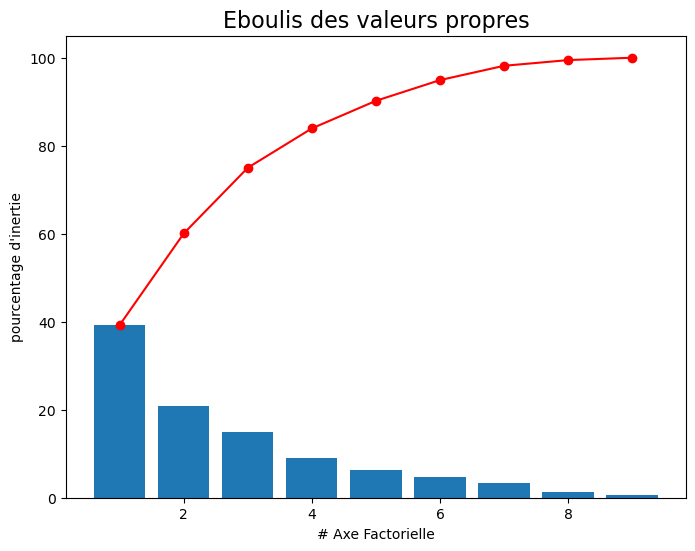

In [9]:
#Variances expliquées
varexpl = acp.explained_variance_ratio_*100

#Projection de l'éboulis des valeurs propres
plt.figure(figsize=(8,6))
plt.bar(np.arange(len(varexpl))+1, varexpl)
plt.plot(np.arange(len(varexpl))+1, varexpl.cumsum(),c="red",marker='o')
plt.xlabel("# Axe Factorielle")
plt.ylabel("pourcentage d'inertie")
plt.title("Eboulis des valeurs propres",fontsize=16)
plt.show(block=False)

****
#### Variance Expliquée
>La première composante accapare `41,64%` de l'information disponible.      
Nous disposons de `61,34%` ac les 2 premiers facteurs     
Et de `77,14%` avec les 3 premiers facteurs.
>
****

<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">1.1 Le cercle des corrélations</div>
<a class="anchor" id="Section_1.1"></a> 

In [10]:
# Contribution des individus dans l'inertie totale
di=np.sum(Z**2,axis=1)
df_di = pd.DataFrame({'d_i':di})

# qualité de la représentation des individus  COS2
cos2=coord1**2
for j in range(p):
    cos2[:,j]=cos2[:,j]/di
    
# valeur corrigée
eigval = (n-1)/n*acp.explained_variance_

# Contribution aux axes
ctr=coord1**2
for j in range(p):
    ctr[:,j]=ctr[:,j]/(n*eigval[j])

df_cnt = pd.DataFrame({'CTR_1':ctr[:,0],'CTR_2':ctr[:,1]})

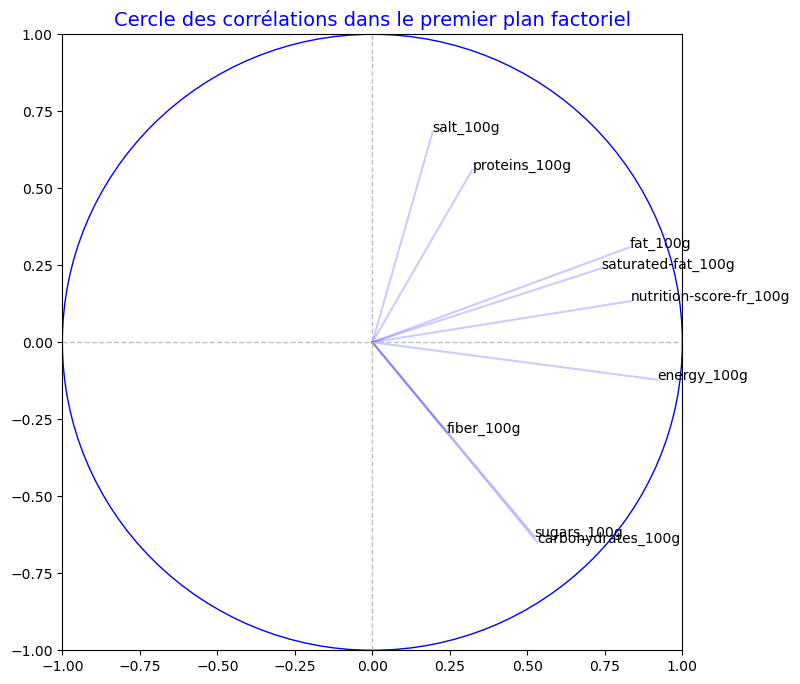

In [11]:
# racine carré des valeurs propres
sqrt_eigval = np.sqrt(eigval)

# corrélation des variables avec les axes
corvar = np.zeros((p,p ))
for k in range(p):
    corvar[: , k] = acp.components_[k, :]*sqrt_eigval[k]

# cercle des correlations
fig,axes=plt.subplots(figsize=(8,8))
axes.set_xlim(-1,1)
axes.set_ylim(-1,1)

# Affichage des étiquettes (noms des variables)
for j in range(p):
    plt.annotate(X.columns[j],(corvar[j,0],corvar[j,1]),fontsize=10)
    plt.plot([0,corvar[j,0]],[0,corvar[j,1]],color='blue',alpha=0.2)
    
# ajouter les deux axes
plt.plot([-1,1],[0,0],color='silver',linestyle='--',linewidth=1)
plt.plot([0,0],[-1,1],color='silver',linestyle='--',linewidth=1)

# Ajouter un cercle
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)

plt.title('Cercle des corrélations dans le premier plan factoriel',fontsize=14,color='b')

# affichage
plt.show()

>L'axe 1 représente l'aspect calorique d'un aliment, corrélé aussi avec le nutrigrade et la quantité de matière grasse.     
L'axe 2 représente le type d'aliment, en haut les aliments plutôt salés, et en bas les aliments plutôt sucrés.

In [12]:
# Création d'un df =  corrélation entre les deux premières composantes et les variables 
df_corr = pd.DataFrame({'CORR_1':corvar[:,0],'CORR_2':corvar[:,1]},index=X.columns)

# cosinus carré des variables
cos2var=corvar**2

# contributions
ctrvar = cos2var

for k in range(p):
    ctrvar[:,k] = ctrvar[:,k]/eigval[k]
    
# Création d'un DF contenant les corrélations aux axes et les leurs contributions
df_ctr = pd.DataFrame({'CTR_1':ctrvar[:,0],'CTR_2':ctrvar[:,1]},index = X.columns)
df_ctr=pd.concat([df_corr, df_ctr],axis=1,keys=["CORRELATION","CONTRIBUTION"])
df_ctr

CORRELATION           CONTRIBUTION          
                             CORR_1    CORR_2        CTR_1     CTR_2
energy_100g                0.919649 -0.121480     0.239356  0.007884
fat_100g                   0.830131  0.308354     0.195027  0.050797
saturated-fat_100g         0.738946  0.239970     0.154535  0.030765
sugars_100g                0.523029 -0.630651     0.077420  0.212481
fiber_100g                 0.239743 -0.292405     0.016266  0.045678
proteins_100g              0.322559  0.560369     0.029445  0.167761
salt_100g                  0.194439  0.682655     0.010700  0.248969
nutrition-score-fr_100g    0.834039  0.133800     0.196867  0.009564
carbohydrates_100g         0.532951 -0.650549     0.080385  0.226101

<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">1.2 Représentation des individus dans le premier plan factoriel</div>
<a class="anchor" id="Section_1.2"></a> 

In [13]:
# Création d'un DF pour la vue 3D

coord=pd.DataFrame(coord1,columns=["X1","X2","X3","X4","X5","X6","X7","X8","X9"])
df_code=pd.DataFrame(list(Quali),columns=["Nutriscore"])
coord=pd.concat([coord,df_code],axis=1)

In [14]:
# Création d'une variable qui fait correspondre aux lettres du nutriscore un entier
# Cette variable permet d'appliquer une couleur différente pour chaque grooupe du nutriscore
conditionlist = [
    (coord['Nutriscore'] =='a'),
    (coord['Nutriscore']=='b'),
    (coord['Nutriscore'] =='c'),
    (coord['Nutriscore']=='d'),
    (coord['Nutriscore']=='e')]
choicelist = [1,2,3,4,5]
coord['col'] = np.select(conditionlist, choicelist, default='non')
coord=coord.astype({'col': int})

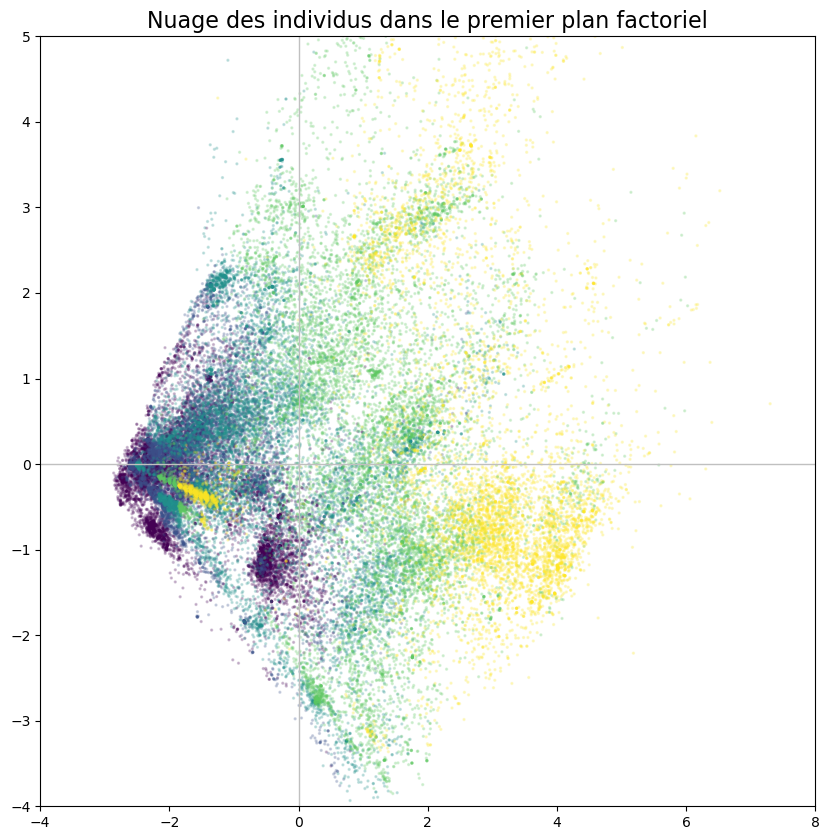

In [15]:
#liste des couleurs
couleurs = ['blues','red','pink','green','orange']

# Création d'un graphique en coloriant les points
fig, axes = plt.subplots(figsize=(10,10))
axes.set_xlim(-4,8)
axes.set_ylim(-4,5)



plt.scatter( x=coord.sort_values([("Nutriscore")]).X1, y=coord.sort_values([("Nutriscore")]).X2, 
            c=coord.sort_values([("Nutriscore")]).col,s=2,alpha=0.2)
        
# ajout les axes
plt.plot([-6,8],[0,0],color='silver',linestyle='-',linewidth=1)
plt.plot([0,0],[-6,6],color='silver',linestyle='-',linewidth=1)

plt.title('Nuage des individus dans le premier plan factoriel',fontsize=16,color='black')

plt.savefig('P3_ACP.png')

#affichage
plt.show()

Quatre groupes existent, indépendement du nitrugrade
- en bas à gauche les aliments sucrés pauvre en calorie
- en bas à droite les aliments sucrés riche en calorie
- en haut à gauche les aliments salés pauvre en calorie
- en haut à droite les aliments salé riche en calorie

In [16]:
import plotly.express as px

fig = px.scatter_3d(coord.sort_values([("Nutriscore")]), x='X1', y='X2', z='X3', color='Nutriscore',size="col",size_max=9 , opacity=0.7,
                   width=900, height=700)
fig.show()

>Coupe en 3d permettant de visualiser les cinqs groupes du nitrigrade

<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">1.3 Corrélation deux à deux & tests de Pearson </div>
<a class="anchor" id="Section_1.3"></a> 

>On pose les hypothèses de départ :     
>
>H0 : Variables indépendantes si p-value > 5%      
H1 : Variables non indépendantes si p-value < 5%

In [17]:
def correl(x1,x2):
    corr,p_val=pearsonr(x1,x2)
    print("Coefficient de corrélation: ",round(corr,3))
    print("P-value de :" ,round(p_val,3))

In [18]:
correl(df.sugars_100g, df.carbohydrates_100g)

Coefficient de corrélation:  0.558
P-value de : 0.0


In [19]:
correl(df.proteins_100g,df.salt_100g)

Coefficient de corrélation:  0.366
P-value de : 0.0


In [20]:
correl(df.fat_100g,df["nutrition-score-fr_100g"])

Coefficient de corrélation:  0.687
P-value de : 0.0


In [21]:
correl(df.energy_100g,df["nutrition-score-fr_100g"])

Coefficient de corrélation:  0.624
P-value de : 0.0


In [22]:
correl(df.fiber_100g,df["nutrition-score-fr_100g"])

Coefficient de corrélation:  -0.135
P-value de : 0.0


<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">1.4 Matrice de corrélation</div>
<a class="anchor" id="Section_1.4"></a> 

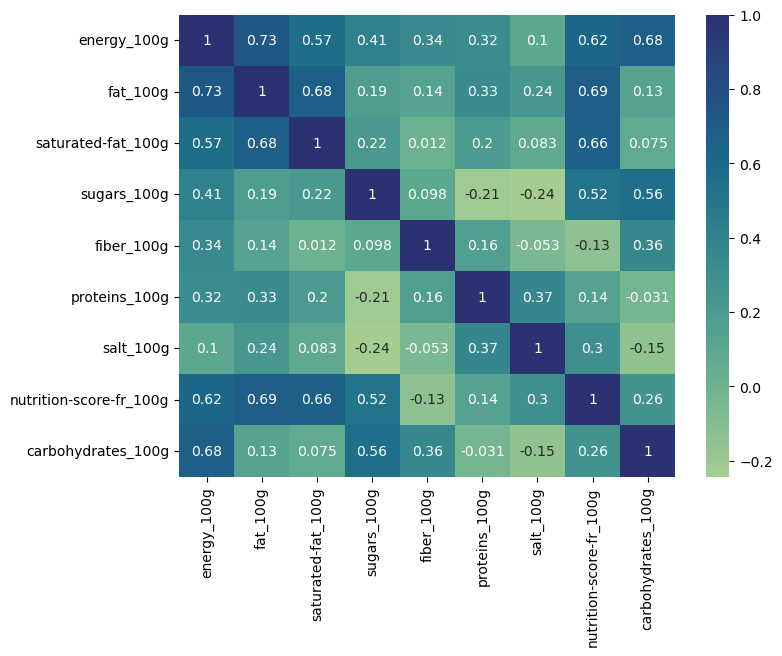

In [23]:
# Matrice de corrélation & heatmap

df_corr = df_acp.corr(method='pearson')
plt.figure(figsize=(8, 6))
sns.heatmap(df_corr, annot=True,cmap="crest")
plt.show()

### Conclusion partie 1
>Les produits sont organisés en plusieurs groupes: sucrés ou salés,    
et les groupes du nutrigrade semblent homogènes.

****
<div style="padding:20px;color:black;margin:0;font-size:200%;display:fill;border-radius:5px;background-color:#e9f1fc;overflow:hidden;font-weight:500">2. Analyse du nutrigrade par rapport aux variables numériques</div>   
<a class="anchor" id="Par_2"></a> 

****

Trois méthodes sont utilisées pour comprendre la manière dont les données sont organisées.
- Une analyse graphique 
    - Boxplot
    - Scatterplot 
- Une ANOVA

<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">2.1 Analyse graphique</div>
<a class="anchor" id="Section_2.1"></a> 

> Cette section permet de comprendre la façon dont les différentes variables numériques     
sont structurées par rapport à la variable nutrigrade.

<AxesSubplot:xlabel='nutrition-score-fr_100g', ylabel='nutrition_grade_fr'>

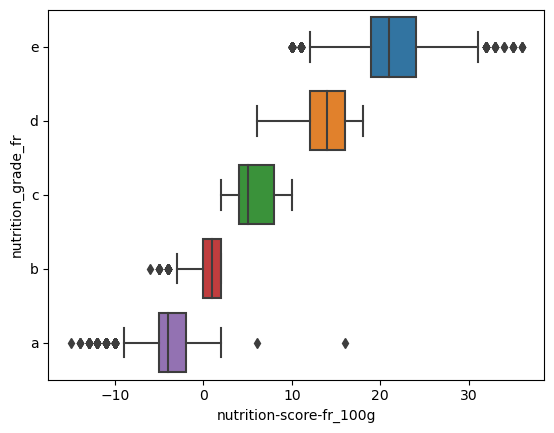

In [24]:
sns.boxplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="nutrition-score-fr_100g",y="nutrition_grade_fr")

<AxesSubplot:xlabel='energy_100g', ylabel='nutrition-score-fr_100g'>

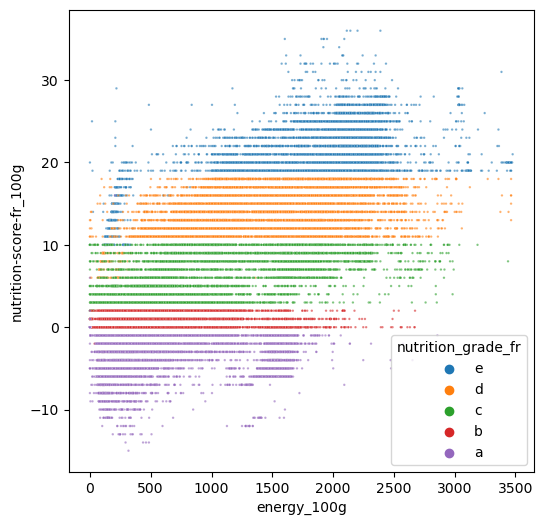

In [25]:
plt.figure(figsize = (6,6))
sns.scatterplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="energy_100g", s=3,alpha=0.6,
                y="nutrition-score-fr_100g",hue="nutrition_grade_fr")

<AxesSubplot:xlabel='fat_100g', ylabel='nutrition-score-fr_100g'>

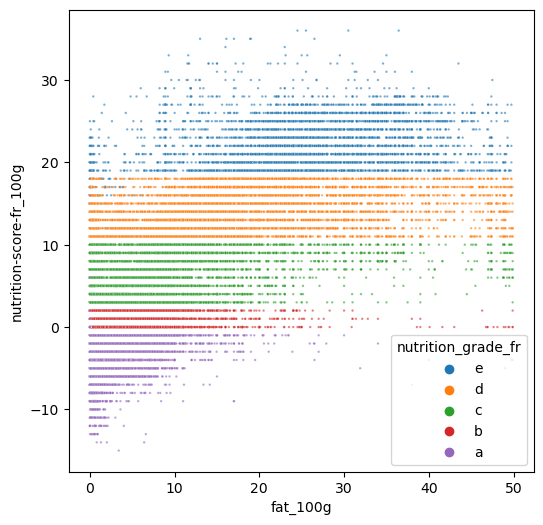

In [26]:
plt.figure(figsize = (6,6))
sns.scatterplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="fat_100g",  s=3,alpha=0.6,
                y="nutrition-score-fr_100g",hue="nutrition_grade_fr")

<AxesSubplot:xlabel='sugars_100g', ylabel='nutrition-score-fr_100g'>

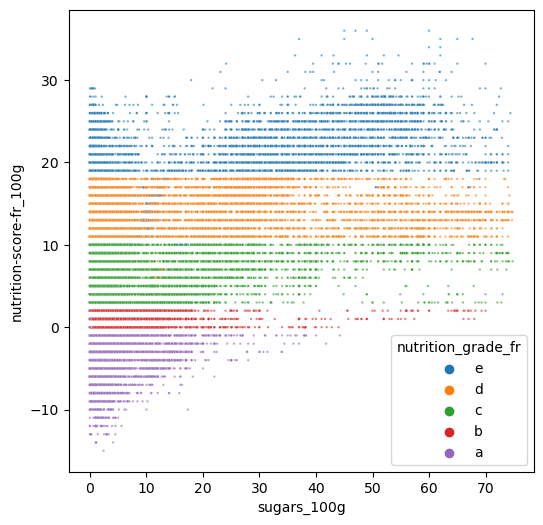

In [27]:
plt.figure(figsize = (6,6))
sns.scatterplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="sugars_100g", s=3,alpha=0.6,
                y="nutrition-score-fr_100g",hue="nutrition_grade_fr")

>Le nutrigrade est visiblement formé par le résultat du nutriscore

<AxesSubplot:xlabel='energy_100g', ylabel='sugars_100g'>

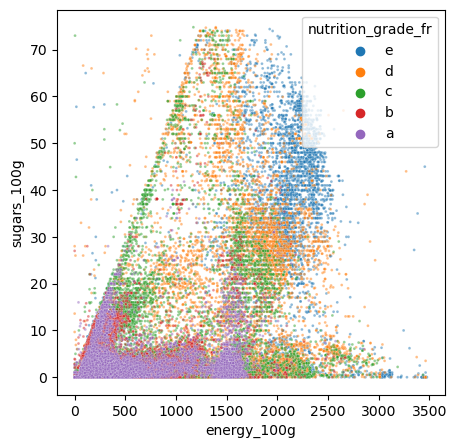

In [28]:
plt.figure(figsize = (5,5))
sns.scatterplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="energy_100g",  s=4,alpha=0.5,
                y="sugars_100g",hue="nutrition_grade_fr")

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42136 entries, 0 to 42135
Data columns (total 17 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   code                     42136 non-null  int64  
 1   creator                  42136 non-null  object 
 2   created_t                42136 non-null  object 
 3   product_name             42136 non-null  object 
 4   quantity                 28073 non-null  object 
 5   pnns_groups_2            28968 non-null  object 
 6   pnns_groups_1            28918 non-null  object 
 7   energy_100g              42136 non-null  float64
 8   fat_100g                 42136 non-null  float64
 9   nutrition_grade_fr       42136 non-null  object 
 10  saturated-fat_100g       42136 non-null  float64
 11  sugars_100g              42136 non-null  float64
 12  fiber_100g               42136 non-null  float64
 13  proteins_100g            42136 non-null  float64
 14  salt_100g             

<div style="padding:20px;color:black;margin:0;font-size:150%;display:fill;border-radius:8px;background-color:#d9d9d9;overflow:hidden;font-weight:100">2.3 Analyse de la variance ANOVA</div>
<a class="anchor" id="Section_2.3"></a> 

> **Rappel de l'ANOVA**      
Méthode statistique du type régression, entre une variable qualitative et une variable quantitative.       
Il s'agit de vérifier l'effet groupe:        
une modalité de la variable qualitative a-t-elle un effet sur la variable qquantitative ?     
 
>Les hypothèses sont les suivantes:      
H0: Il n'y a pas d'effet de groupe        
H1: Il y a un effet groupe

>Avant de pratiquer une ANOVA il convient de vérifier deux caractéristiques de la base de données.       
>1. la variance inter-groupe doit être similaire       
>2. Chaque modalité doit suivre une loi normale   

>Nous vérifirons ces hypothèses visuellement à l'aide de boxplot.

*****
>L'ANOVA répond à la question:   
Le sucre explique t-il le nutrigrade ?      
Y-a-t-il un effet groupe?

<AxesSubplot:xlabel='sugars_100g', ylabel='nutrition_grade_fr'>

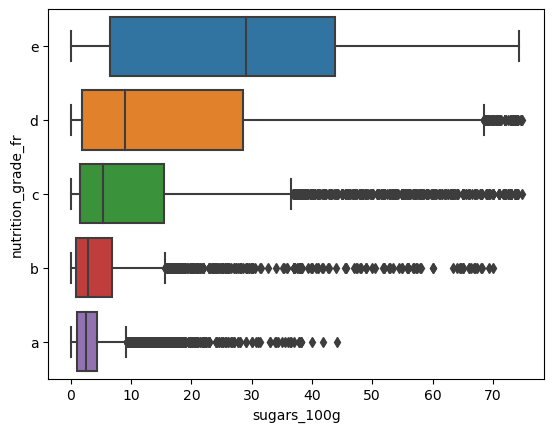

In [30]:
sns.boxplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="sugars_100g",y="nutrition_grade_fr")

> Ni la normalité des groupes, ni l'égalité des variances ne sont respectées. 

In [31]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('sugars_100g ~ nutrition_grade_fr', data=df).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            sugars_100g   R-squared:                       0.233
Model:                            OLS   Adj. R-squared:                  0.233
Method:                 Least Squares   F-statistic:                     3207.
Date:                Thu, 10 Nov 2022   Prob (F-statistic):               0.00
Time:                        12:48:43   Log-Likelihood:            -1.7286e+05
No. Observations:               42136   AIC:                         3.457e+05
Df Residuals:                   42131   BIC:                         3.458e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [32]:
anova_table = sm.stats.anova_lm(model,typ=2)
anova_table

,sum_sq,df,F,PR(>F)
nutrition_grade_fr,2.747956e+06,4.0,3207.227231,0.0
Residual,9.024472e+06,42131.0,NaN,NaN


>**Interprétation des résultats de l'ANOVA**       
Nous rejetons H0, comme attendu, car ce test est sensible aux hypothèses de normalités et d'égalité des variances.     
L'effet groupe existe, il est d'ailleur visible lorsqu'on regarde les boxplots.
*********

*******
>L'ANOVA repond à la question:     
Le type de produit (pnns_group_2) explique t-il le nutriscore ?       
Y-a-t-il un effet groupe?     

<AxesSubplot:xlabel='nutrition-score-fr_100g', ylabel='pnns_groups_2'>

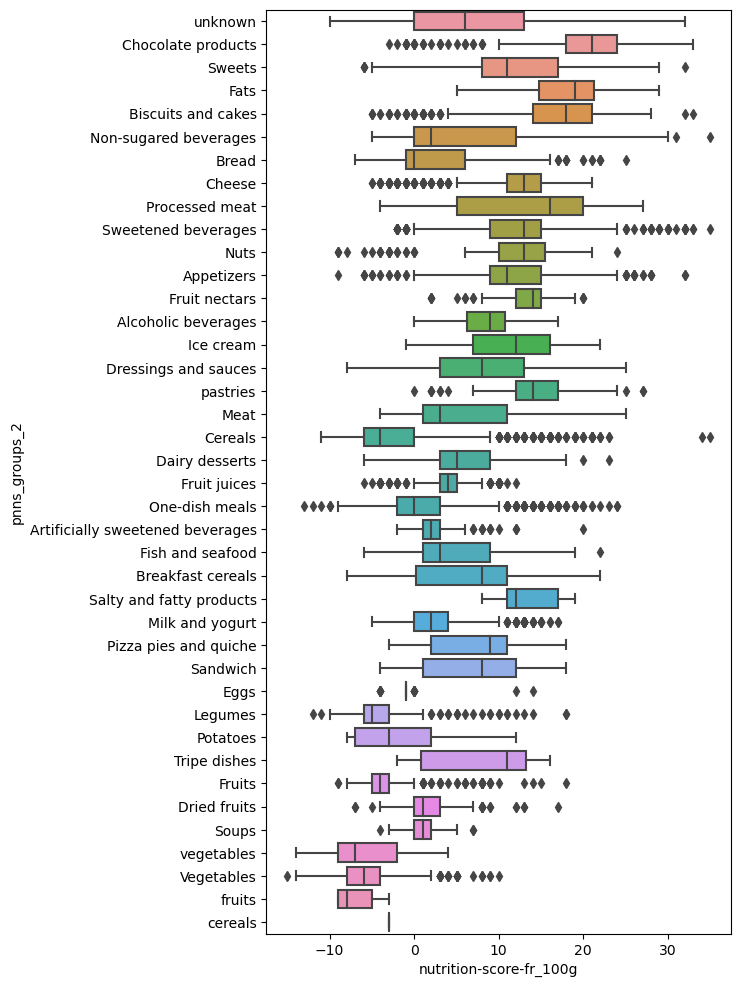

In [33]:
plt.figure(figsize = (6,12))
sns.boxplot(data=df.sort_values([("nutrition_grade_fr")],ascending=False), x="nutrition-score-fr_100g",y="pnns_groups_2")

> Ni la normalité des groupes, ni l'égalité des variances ne sont respectées. 

In [34]:
df=df.rename(columns={'nutrition-score-fr_100g':'nutriscore'})
df

,code,creator,created_t,product_name,quantity,pnns_groups_2,pnns_groups_1,energy_100g,fat_100g,nutrition_grade_fr,saturated-fat_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,nutriscore,carbohydrates_100g
0,36252,tacinte,2015-01-25 22:35:01,Lion Peanut x2,NaN,unknown,unknown,1883.0,20.00,e,12.50,57.50,2.5,2.50,0.09652,22.0,70.00
1,10207260,kiliweb,2017-03-22 18:17:11,Praliné Amande Et Noisette,NaN,NaN,NaN,2406.0,37.50,d,2.90,50.30,3.9,9.50,0.00300,14.0,55.00
2,40608754,andre,2012-08-15 11:48:28,"Pepsi, Nouveau goût !",15 cl,Sweetened beverages,Beverages,177.0,0.00,e,0.00,10.40,0.0,0.00,0.02540,13.0,10.40
3,69161025,kiliweb,2017-03-22 20:59:36,Tarte Poireaux Et Lardons,NaN,NaN,NaN,1079.0,20.15,d,11.00,1.00,1.4,7.50,0.80000,15.0,10.50
4,10,jeanbono,2016-10-20 09:19:01,Madeleines nature,880 g,Biscuits and cakes,Sugary snacks,1900.0,23.00,d,2.50,26.00,1.5,6.00,0.66000,12.0,55.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42131,9778564312457,kiliweb,2017-01-23 17:57:57,Nature cheddar and red onion crisps,NaN,Appetizers,Salty snacks,2155.0,34.50,c,3.40,1.80,5.6,7.80,1.35000,9.0,47.50
42132,9782211109758,kiliweb,2017-03-08 21:05:58,Verrine Cheescake Myrtille,NaN,NaN,NaN,1084.0,13.50,d,12.00,10.50,0.0,8.70,0.29000,16.0,26.00
42133,9847548283004,drmalabar,2015-07-25 11:47:06,Tartines craquantes bio au sarrasin,NaN,Bread,Cereals and potatoes,1643.0,2.80,a,0.60,2.60,5.9,13.00,0.68000,-4.0,74.80
42134,9900000000233,kiliweb,2017-04-01 22:52:18,Amandes,NaN,NaN,NaN,2406.0,46.95,b,3.73,3.89,12.2,21.22,0.10000,0.0,17.15


In [35]:
model = ols('nutriscore ~ pnns_groups_2', data=df).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             nutriscore   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.549
Method:                 Least Squares   F-statistic:                     906.7
Date:                Thu, 10 Nov 2022   Prob (F-statistic):               0.00
Time:                        12:48:45   Log-Likelihood:                -92863.
No. Observations:               28968   AIC:                         1.858e+05
Df Residuals:                   28928   BIC:                         1.861e+05
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                                                        coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

In [36]:
anova_table = sm.stats.anova_lm(model,typ=2)
anova_table

,sum_sq,df,F,PR(>F)
pnns_groups_2,1.262153e+06,39.0,906.729033,0.0
Residual,1.032495e+06,28928.0,NaN,NaN


>**Interprétation des résultats de l'ANOVA**       
Nous rejetons H0, comme attendu, car ce test est sensible aux hypothèses de normalités et d'égalité des variances.     
L'effet groupe existe, il est d'ailleur visible lorsqu'on regarde les boxplots.
*********

****
<div style="padding:20px;color:black;margin:0;font-size:200%;text-align:center;display:fill;border-radius:5px;background-color:#e9f1fc;overflow:hidden;font-weight:500">Conclusion et Recommandations</div>   
<a class="anchor" id="Conclusion"></a> 

****

>Au vu des résultats, nous proposons l'application **Check_my_food**   

>Une app qui convertit la quantité de calories d’un produit scanné, en temps de sport.        
D'un point de vue opérationnel l'utilisateur renseigne son poid, son niveau sportif, le sport et l'application renvoit le temps  nécessaire pour éliminer les calories du produit scanné.

# 📄 References<a class="anchor" id="Références"></a> 
- [Santé Publique France](https://www.santepubliquefrance.fr/)
- [Open_fact_food](https://world.openfoodfacts.org/)
- [Téléchargement des données](https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/parcours-data-scientist/P2/fr.openfoodfacts.org.products.csv.zip)
- [Dictionnaire des données](https://world.openfoodfacts.org/data/data-fields.txt)
- [Librairie Pandas](https://pandas.pydata.org/docs/user_guide/index.html#)
- [Librairie scikit-learn](https://scikit-learn.org/stable/user_guide.html)
- [ANOVA Technique](https://www.pythonfordatascience.org/anova-python/)
- [Librairie plotly](https://plotly.com/python/)